In [ ]:
#download these weights for imagenet21k weights
#!wget -c https://storage.googleapis.com/vit_models/imagenet21k/ViT-B_16.npz
#download these weights for imagenet21k + imagenet1k fine tuned weights
!wget -c https://storage.googleapis.com/vit_models/imagenet21k%2Bimagenet2012/ViT-B_16-224.npz

--2021-02-18 15:37:52--  https://storage.googleapis.com/vit_models/imagenet21k%2Bimagenet2012/ViT-B_16-224.npz
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.69.128, 108.177.126.128, 108.177.127.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.69.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 346335542 (330M) [application/octet-stream]
Saving to: ‘ViT-B_16-224.npz’

ViT-B_16-224.npz    100%[===================>] 330.29M   200MB/s    in 1.7s    

2021-02-18 15:37:54 (200 MB/s) - ‘ViT-B_16-224.npz’ saved [346335542/346335542]



In [ ]:
from torch.nn import CrossEntropyLoss, Dropout, Softmax, Linear, Conv2d, LayerNorm
from torch.nn.modules.utils import _pair
import cv2
import torch
import os
from tqdm import tqdm
import math
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, RandomSampler ,SequentialSampler
from torch.optim.lr_scheduler import LambdaLR
import matplotlib.pyplot as plt
%matplotlib inline
device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
class mh_attention(torch.nn.Module):
  def __init__(self,mid_dim,n_heads):
    super(mh_attention,self).__init__()
    self.n_heads=n_heads
    self.head_size=int(mid_dim/self.n_heads)
    
    self.key=torch.nn.Linear(in_features=mid_dim,out_features=self.n_heads*self.head_size)
    self.query=torch.nn.Linear(in_features=mid_dim,out_features=self.n_heads*self.head_size)
    self.value=torch.nn.Linear(in_features=mid_dim,out_features=self.n_heads*self.head_size)

    self.out_linear=torch.nn.Linear(in_features=mid_dim,out_features=mid_dim)
     
  
  def forward(self,x):
    key_val=self.key(x)
    query_val=self.query(x)
    value_val=self.value(x)
    #before sperating the heads output the output dimension is (bs,n_patches,n_heads*head_size)
    #seperating the multiple heads and chaging dimension to (bs,n_heads,n_patches,op_feat_dim)
    key_val=key_val.reshape(key_val.shape[0],key_val.shape[1],
    self.n_heads,int(self.head_size))#n_heads,all_head_size/num_attention_head
    
    key_val=key_val.permute(0,2,1,3)
    query_val=query_val.reshape(query_val.shape[0],query_val.shape[1],
    self.n_heads,int(self.head_size))#n_heads,all_head_size/num_attention_head
    
    query_val=query_val.permute(0,2,1,3)
    value_val=value_val.reshape(value_val.shape[0],value_val.shape[1],
    self.n_heads,int(self.head_size))#n_heads,all_head_size/num_attention_head
    value_val=value_val.permute(0,2,1,3) 

    #softmax((q(k.T))/sqrt(n))@V
    att_weights1=torch.matmul(query_val,key_val.transpose(-1,-2))
    att_weights=att_weights1/math.sqrt(self.head_size)
    att_weights=F.softmax(att_weights,dim=-1)
    att_map=att_weights
    att_weights=F.dropout(att_weights,p=0.0)
    
    att_op=torch.matmul(att_weights,value_val)
    att_op=att_op.permute(0,2,1,3).contiguous()#(bs,n_patches,n_heads,heads_dim(768/12))
    #reshape into bs,n_patches,n_heads*heads_dim
    #new_context_layer_shape = context_layer.size()[:-2] + (self.all_head_size,)
    att_op_shape=att_op.size()[:-2] + (768,)
    #context_layer = context_layer.view(*new_context_layer_shape)
    att_op=att_op.view(*att_op_shape)
    att_op=self.out_linear(att_op)
    att_op=F.dropout(att_op,p=0.0,training=False)
    return (att_op,att_map)

In [ ]:
class perceptron(torch.nn.Module):
  def __init__(self,ip_dim,mid_dim,out_dim):
    super(perceptron,self).__init__()
    self.fc1=torch.nn.Linear(in_features=ip_dim,out_features=mid_dim)
    torch.nn.init.xavier_uniform_(self.fc1.weight)
    torch.nn.init.normal_(self.fc1.bias,std=1e-6)
    self.fc2=torch.nn.Linear(in_features=mid_dim,out_features=out_dim)
    torch.nn.init.xavier_uniform_(self.fc2.weight)
    torch.nn.init.normal_(self.fc2.bias,std=1e-6)

  def forward(self,x,train=False):
    x=self.fc1(x)
    x=F.gelu(x)
    x=F.dropout(x,p=0.1,training=train)
    x=self.fc2(x)
    x=F.dropout(x,p=0.1,training=train)
    return (x)

In [ ]:
class linear_projection(torch.nn.Module):
  #make embeddings for image patches
  def __init__(self,height,width,patch_size,in_channel,out_channel):
    super(linear_projection,self).__init__()
    n_patches=int((height*width)/(patch_size*patch_size))

    self.embedding_patch=torch.nn.Conv2d(in_channels=in_channel,out_channels=out_channel,kernel_size=(patch_size,patch_size),
                               stride=(patch_size,patch_size))
    self.embedding_pos=torch.nn.Parameter(torch.zeros(1,int(n_patches)+1,out_channel))
    self.embedding_class=torch.nn.Parameter(torch.zeros(1,1,out_channel))
  
  def forward(self,x,training=False):
    #try to pass the class AND POS through a mlp and then concat and add it
    #the input image goes through a 2dconvolution with op_channels=mid_dim
    #conv(x)==>(bs,mid_dim,height/tpatch_h,width/patch_w)==>(bs,mid_dim*ps*ps)==>x+class(bs,mid_dim*ps*ps+1)
    #x+class(bs,mid_dim*ps*ps+1)==>((x+class)+position)==>(bs,mid_dim*ps*ps+1)
    embedding_class=self.embedding_class.expand(x.shape[0],-1,-1)
    x=self.embedding_patch(x)
    x=x.flatten(2)
    x=x.transpose(-1,-2)
    x=torch.cat((embedding_class,x),dim=1)
    x=x+self.embedding_pos
    x=F.dropout(x,p=0.1,training=training)

    return (x)

In [ ]:
class encoder_block(torch.nn.Module):
  def __init__(self,hybrid,ip_dim,mid_dim,out_dim,n_heads):
    super(encoder_block,self).__init__()
    self.norm1=torch.nn.LayerNorm(ip_dim,eps=1e-6)
    self.mha=mh_attention(ip_dim,n_heads)
    self.norm2=torch.nn.LayerNorm(ip_dim,eps=1e-6)
    self.mlp=perceptron(ip_dim,mid_dim,out_dim)
  
  def forward(self,x):
    x1=x
    x=self.norm1(x)
    x,map=self.mha(x)
    x=x+x1

    x1=x
    x=self.norm2(x)
    x=self.mlp(x)
    x=x+x1
    return (x,map)
  
  def load_weight(self,block_no,weight,mid_dim):
    root_path="Transformer/encoderblock_" + str(block_no)
    query_path="MultiHeadDotProductAttention_1/"+str("query/")
    key_path="MultiHeadDotProductAttention_1/"+str("key/")
    value_path="MultiHeadDotProductAttention_1/"+str("value/")
    mha_out_path="MultiHeadDotProductAttention_1/out"
    layer_path0="MlpBlock_3/Dense_0"
    layer_path1="MlpBlock_3/Dense_1"
    norm_path0="LayerNorm_0"
    norm_path1="LayerNorm_2"
    with torch.no_grad():
      query_weight=torch.from_numpy(weight[os.path.join(root_path,query_path,"kernel")])
      query_weight=query_weight.view(mid_dim,mid_dim).t()
      query_bias=torch.from_numpy(weight[os.path.join(root_path,query_path,"bias")])
      query_bias=query_bias.view(mid_dim)
      self.mha.query.weight.copy_(query_weight)
      self.mha.query.bias.copy_(query_bias)

      
      key_weight=torch.from_numpy(weight[os.path.join(root_path,key_path,"kernel")])
      key_weight=key_weight.view(mid_dim,mid_dim).t()
      key_bias=torch.from_numpy(weight[os.path.join(root_path,key_path,"bias")])
      key_bias=key_bias.view(mid_dim)
      self.mha.key.weight.copy_(key_weight)
      self.mha.key.bias.copy_(key_bias)
      
      value_weight=torch.from_numpy(weight[os.path.join(root_path,value_path,"kernel")])
      value_weight=value_weight.view(mid_dim,mid_dim).t()
      value_bias=torch.from_numpy(weight[os.path.join(root_path,value_path,"bias")])
      value_bias=value_bias.view(mid_dim)
      self.mha.value.weight.copy_(value_weight)
      self.mha.value.bias.copy_(value_bias)


      linear_out_weight=torch.from_numpy(weight[os.path.join(root_path,mha_out_path,"kernel")])
      linear_out_weight=linear_out_weight.view(mid_dim,mid_dim).t()
      self.mha.out_linear.weight.copy_(linear_out_weight)
      linear_out_bias=torch.from_numpy(weight[os.path.join(root_path,mha_out_path,"bias")])
      linear_out_bias=linear_out_bias.view(mid_dim)
      self.mha.out_linear.bias.copy_(linear_out_bias)


      weight_0_path=os.path.join(root_path,layer_path0,"kernel")
      weight_0=torch.from_numpy(weight[weight_0_path]).t()
      self.mlp.fc1.weight.copy_(weight_0)
      bias_0_path=os.path.join(root_path,layer_path0,"bias")
      bias_0=torch.from_numpy(weight[bias_0_path]).t()
      self.mlp.fc1.bias.copy_(bias_0)

      weight_1_path=os.path.join(root_path,layer_path1,"kernel")
      weight_1=torch.from_numpy(weight[weight_1_path]).t()
      self.mlp.fc2.weight.copy_(weight_1)
      bias_1_path=os.path.join(root_path,layer_path1,"bias")
      bias_1=torch.from_numpy(weight[bias_1_path]).t()
      self.mlp.fc2.bias.copy_(bias_1)

      scale_0_path=os.path.join(root_path,norm_path0,"scale")
      scale_0=torch.from_numpy(weight[scale_0_path])
      self.norm1.weight.copy_(scale_0)
      bias_0_path=os.path.join(root_path,norm_path0,"bias")
      bias_0=torch.from_numpy(weight[bias_0_path])
      self.norm1.bias.copy_(bias_0)

      scale_1_path=os.path.join(root_path,norm_path1,"scale")
      scale_1=torch.from_numpy(weight[scale_1_path])
      self.norm2.weight.copy_(scale_1)
      bias_1_path=os.path.join(root_path,norm_path1,"bias")
      bias_1=torch.from_numpy(weight[bias_1_path])
      self.norm2.bias.copy_(bias_1)      

In [ ]:
class vit(torch.nn.Module):
  def __init__(self,img_size,mid_dim,mlp_mid_dim,n_blocks,n_classes,n_heads,cifar=False):
    super(vit,self).__init__()
    self.block_mid_dim=mid_dim
    self.n_blocks=n_blocks
    self.embedding=linear_projection(height=img_size,width=img_size,patch_size=16,in_channel=3,out_channel=mid_dim)
    if not cifar:
      self.embedding=self.embedding.eval()
    self.enc_layer=torch.nn.ModuleList()
    self.norm=torch.nn.LayerNorm(mid_dim,eps=1e-6)
    for i in range(self.n_blocks):
      enc_block=encoder_block(hybrid=False,ip_dim=mid_dim,mid_dim=mlp_mid_dim,out_dim=mid_dim,n_heads=n_heads)
      if not cifar:
        enc_block=enc_block.eval()
      self.enc_layer.append(enc_block)
    self.classifier_head=torch.nn.Linear(mid_dim,n_classes)
  
  def forward(self,x):
    attn_maps=[]
    emb_patches=self.embedding(x)
    encoded_op,maps=self.enc_layer[0](emb_patches)
    attn_maps.append(maps)
    for block in self.enc_layer[1:]:
      encoded_op,maps=block(encoded_op)
      attn_maps.append(maps)
    encoded_op1=self.norm(encoded_op)
    logits=self.classifier_head(encoded_op1[:,0])
    return (encoded_op,logits,attn_maps)
  
  def load_weights(self,weight,cifar=False):
    with torch.no_grad():
      self.embedding.embedding_patch.weight.copy_(torch.from_numpy(weight["embedding/kernel"].transpose([3,2,0,1])))
      self.embedding.embedding_patch.bias.copy_(torch.from_numpy(weight["embedding/bias"]))
      self.embedding.embedding_class.copy_(torch.from_numpy(weight["cls"]))

      emb_pos=torch.from_numpy(weight["Transformer/posembed_input/pos_embedding"])
      self.embedding.embedding_pos.copy_(emb_pos)
      self.norm.weight.copy_(torch.from_numpy(weight["Transformer/encoder_norm/scale"]))
      self.norm.bias.copy_(torch.from_numpy(weight["Transformer/encoder_norm/bias"]))

      #load weights for the blocks and check tensors w/o classifier
      for i,block in self.enc_layer.named_children():
        block.load_weight(block_no=i,weight=weight,mid_dim=768)
        print("loaded weights for block no:",i)
      
      #load weight classifier
      if cifar:
        torch.nn.init.zeros(self.classifier_head.weight)
        torch.nn.init.zeros(self.classifier_head.bias)
      else:
        self.classifier_head.weight.copy_(torch.from_numpy(weights["head/kernel"]).t())
        self.classifier_head.bias.copy_(torch.from_numpy(weights["head/bias"]).t())

In [ ]:
imagenet1k_model=vit(img_size=224,mid_dim=768,mlp_mid_dim=3072,n_blocks=12,n_classes=1000,n_heads=12)
imagenet1k_model=imagenet1k_model.eval()
weights=np.load("ViT-B_16-224.npz")
imagenet1k_model.load_weights(weights,cifar=False)

loaded weights for block no: 0
loaded weights for block no: 1
loaded weights for block no: 2
loaded weights for block no: 3
loaded weights for block no: 4
loaded weights for block no: 5
loaded weights for block no: 6
loaded weights for block no: 7
loaded weights for block no: 8
loaded weights for block no: 9
loaded weights for block no: 10
loaded weights for block no: 11


### Imagenet1k tesing

In [ ]:
from urllib.request import urlretrieve
if not os.path.isfile("ilsvrc2012_wordnet_lemmas.txt"):
    urlretrieve("https://storage.googleapis.com/bit_models/ilsvrc2012_wordnet_lemmas.txt", "ilsvrc2012_wordnet_lemmas.txt")

In [ ]:
imagenet_labels=dict(enumerate(open('ilsvrc2012_wordnet_lemmas.txt')))

In [ ]:
n_label=0
for key,val in imagenet_labels.items():
  n_label+=len([x for x in imagenet_labels[key]])
print(n_label)

21675


In [70]:
from PIL import Image
transform=transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])
path="/content/n02123394_Persian_cat.JPEG"
sample_image=Image.open(path)
sample_image=transform(sample_image)
print(sample_image.shape)

torch.Size([3, 224, 224])


In [71]:
#imagenet1k_model.eval()
enc_ops,preact_logit,attn_map=imagenet1k_model(sample_image.unsqueeze(0))
softmax_dist=torch.nn.Softmax(dim=-1)(preact_logit)
preds_desc=torch.argsort(softmax_dist,dim=-1,descending=True)
print("Prediction Label\n")
for idx in preds_desc[0,:5]:
    print(f'{softmax_dist[0, idx.item()]:.5f} : {imagenet_labels[idx.item()]}', end='')

Prediction Label

0.99375 : Persian_cat
0.00045 : tabby, tabby_cat
0.00045 : lynx, catamount
0.00038 : tiger_cat
0.00036 : Egyptian_cat


### VISUALIZATIONS

In [72]:
#Reference:https://nbviewer.jupyter.org/github/jeonsworld/ViT-pytorch/blob/main/visualize_attention_map.ipynb
print(attn_map[0].shape)
attn_map=torch.stack(attn_map)
print(attn_map.shape)
attn_map=attn_map.squeeze(1)
print(attn_map.shape)

torch.Size([1, 12, 197, 197])
torch.Size([12, 1, 12, 197, 197])
torch.Size([12, 12, 197, 197])


In [73]:
attn_map=torch.mean(attn_map,dim=1)
sample_image=Image.open(path)
im=sample_image

In [74]:
residual_att=torch.eye(attn_map.size(1))
aug_att_mat=attn_map+residual_att
aug_att_mat=aug_att_mat/aug_att_mat.sum(dim=-1).unsqueeze(-1)
joint_attentions = torch.zeros(aug_att_mat.size())
joint_attentions[0] = aug_att_mat[0]
for n in range(1, aug_att_mat.size(0)):
  joint_attentions[n]=torch.matmul(aug_att_mat[n],joint_attentions[n-1])
v=joint_attentions[-1]
grid_size=int(np.sqrt(aug_att_mat.size(-1)))

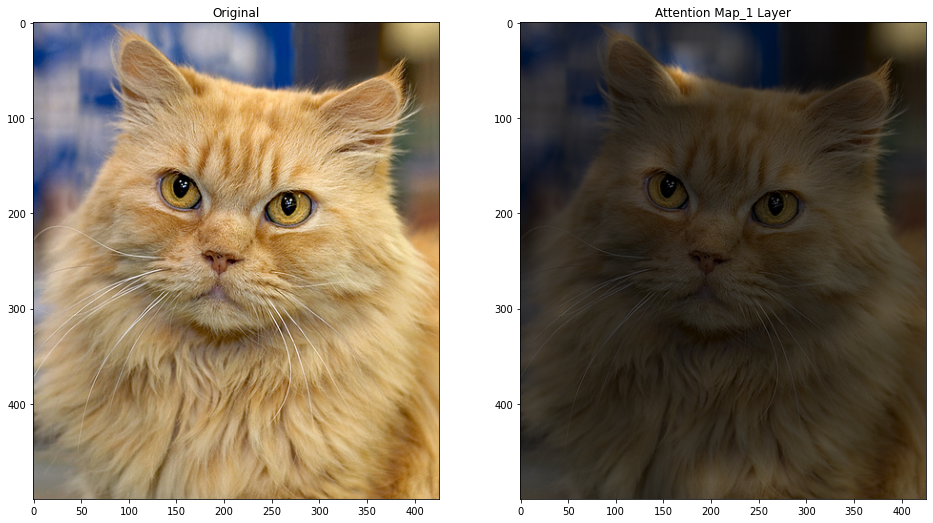

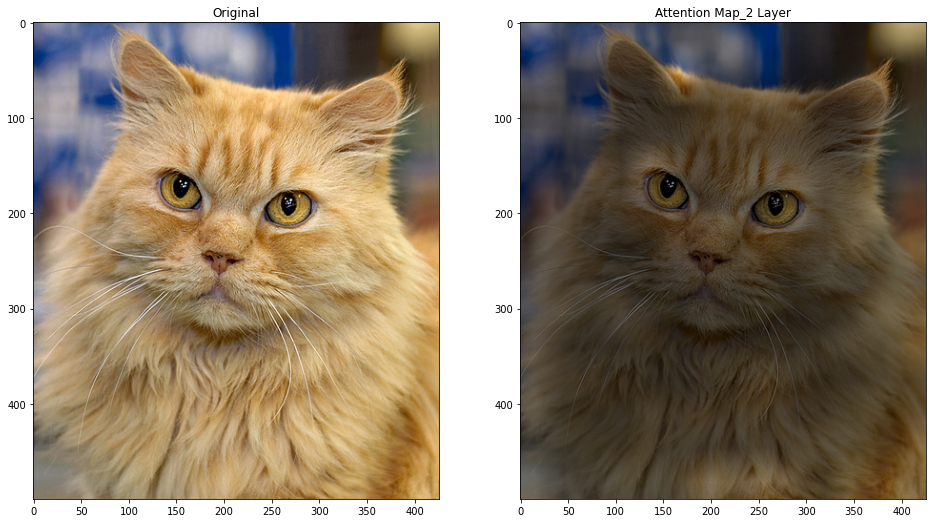

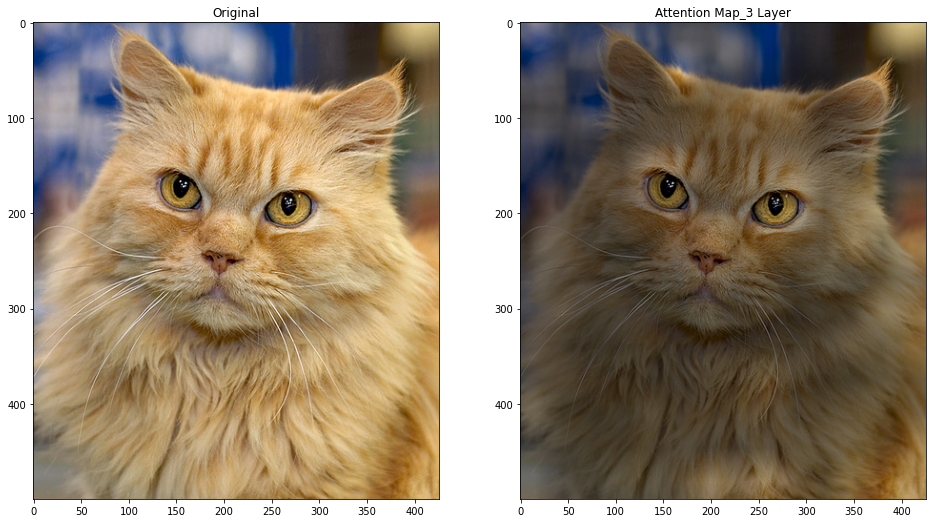

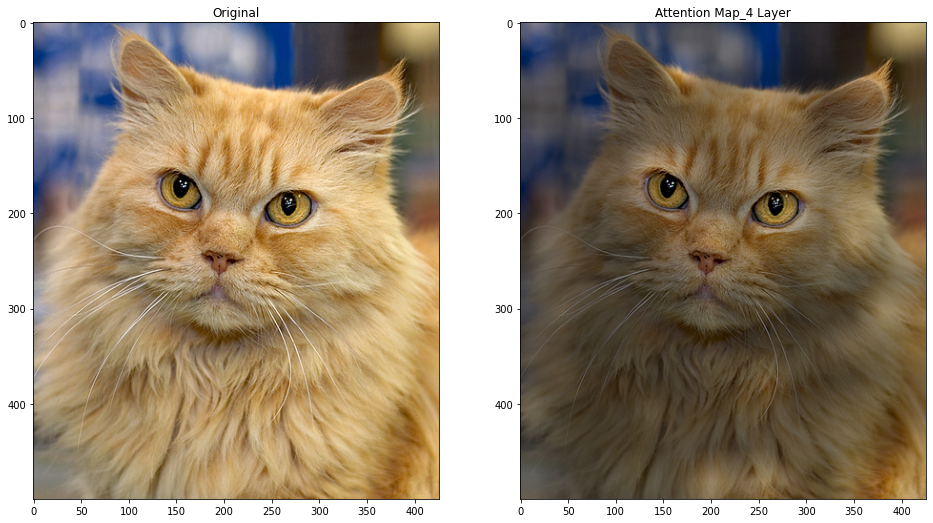

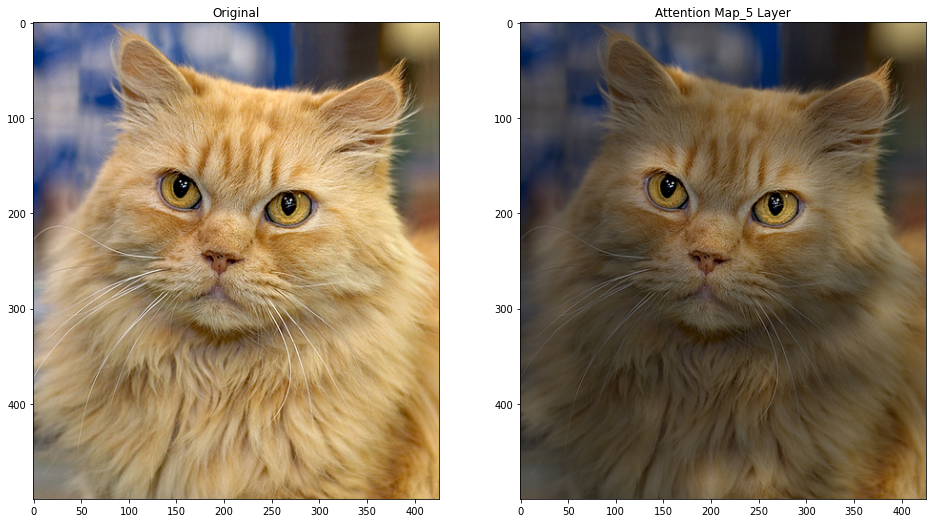

...

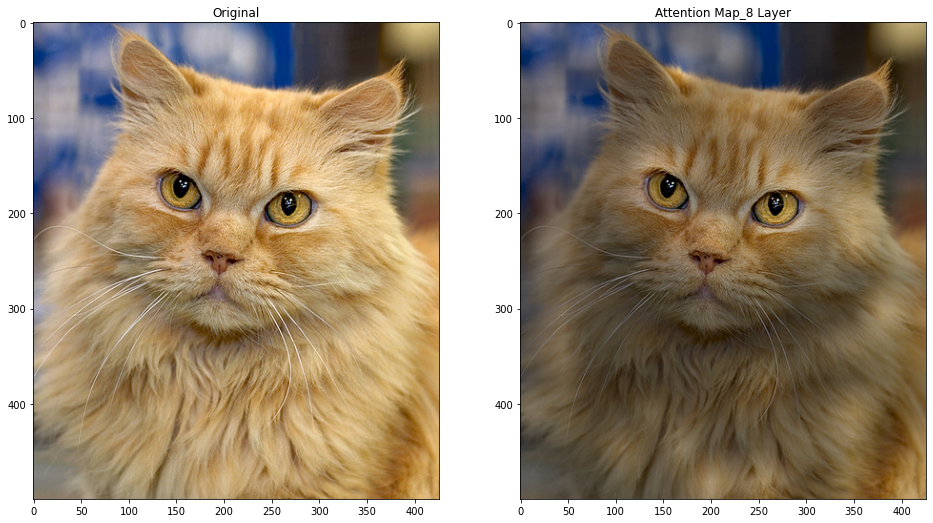

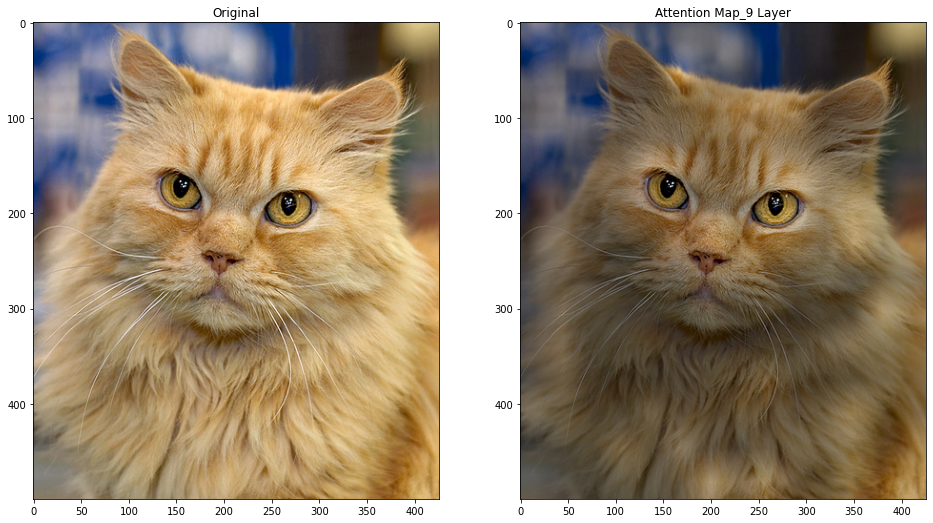

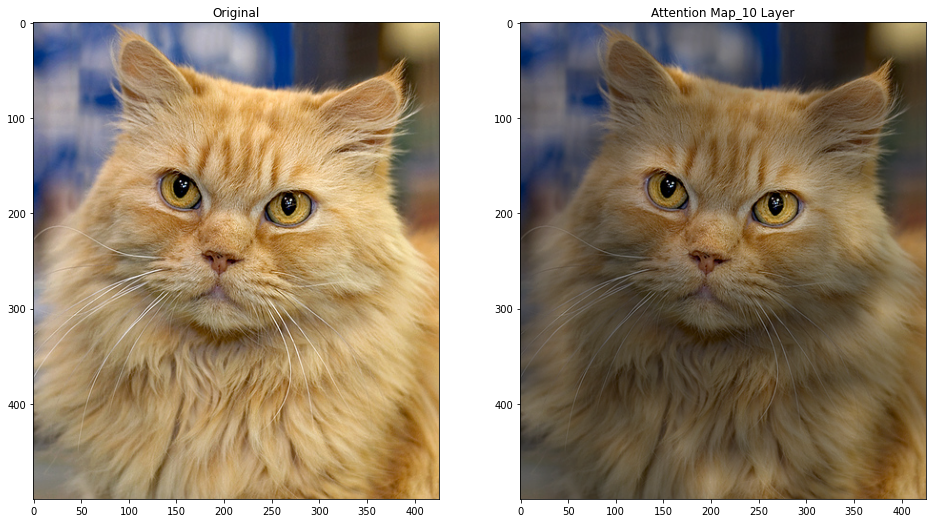

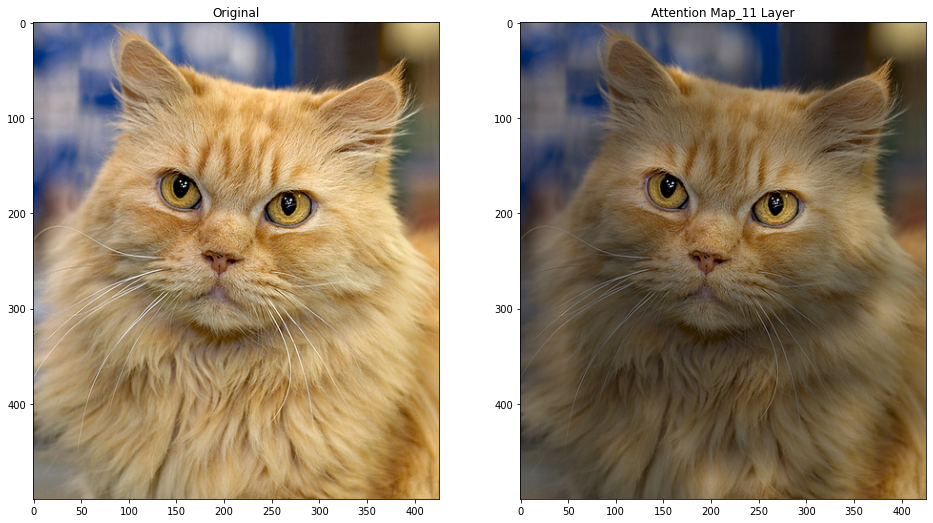

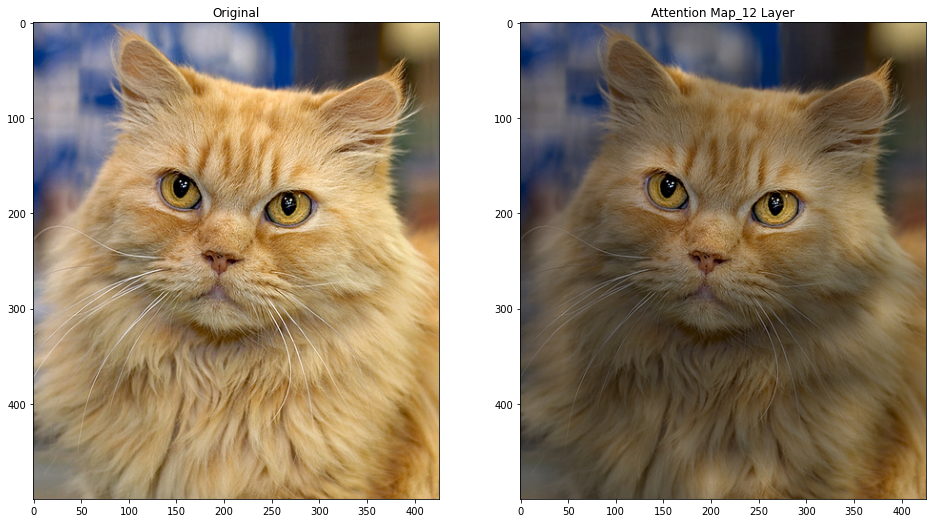

In [75]:

for i, v in enumerate(joint_attentions):
  mask=v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
  mask=cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
  result=(mask * im).astype("uint8")
  fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
  ax1.set_title('Original')
  ax2.set_title('Attention Map_%d Layer' % (i+1))
  _=ax1.imshow(im)
  _=ax2.imshow(result)